# <center> Лабораторная работа №2. Кластерный анализ. </center>

In [18]:
import random
import pandas as pd
import pylab as pl
import numpy as np
import scipy.spatial as ss
import sklearn.cluster as sc
import sklearn.manifold as sm
import sklearn.datasets as ds
import sklearn.metrics as smt

import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, cdist

# **<i>Документация к реализации Partition Around Medoids</i>**
<br>

### **<i>PAM(k=3, metric="euclidean", max_iter = 300, tol=0.001)</i>**
<br>

### **<i>PARAMETERS</i>**

<ul>
  <li><h3><i>k: int, default=3</i></h3></li>
        The number of clusters to form as well as the number of centroids to generate.
  <li><h3><i>metric: str, default='euclidean'</i></h3></li>
        Metric used to compute the linkage.
  <li><h3><i>max_iter: int, default=300</i></h3></li>
        Maximum number of iterations of the k-means algorithm for a single run.
  <li><h3><i>tol: float, default=1e-3</i></h3></li>
        Relative tolerance with regards to inertia to declare convergence.
</ul>

### **<i>ATTRIBUTES</i>**

<ul>
  <li><h3><i>inertia_: float</i></h3></li>
        Sum of squared distances of samples to their closest cluster medoid.
  <li><h3><i>medoids_: list of len (n_clusters)</i></h3></li>
        Coordinates of cluster medoids. If the algorithm stops before fully converging (see tol and max_iter), these will not be consistent with labels_.
  <li><h3><i>labels_: ndarray of shape (n_samples,)</i></h3></li>
        Labels of each point.      
</ul>
<br>
<br>

### **<i>METHOD fit(self, X)</i>**
#### Compute partiton around medoids clustering.
### **<i>PARAMETERS</i>**
<ul>
<li><h3><i>X: array-like or sparse matrix, shape=(n_samples, n_features)</i></h3></li>
        Training instances to cluster.
</ul>
<br>

### **<i>RETURNS</i>**
<ul>
<li><h3><i>self</i></h3></li>
        Fitted estimator.
</ul>


## Особенности работы алгоритма описаны комментариями непосредственно в коде

In [127]:
from sklearn.base import BaseEstimator
from itertools import cycle
from math import hypot


def medoid_distribution(med_ind, data):
    dist_vector = np.zeros(len(data)) # ближайшая медоида для каждого объекта
    dist_matr = np.zeros((len(data), len(med_ind))) # матрица расстояний
    target = np.Inf # значение целевой функции
    min_dists = np.zeros(len(data))
    
    for idx, p in enumerate(data):
        ''' поиск для каждого объекта данных ближайшего к нему медоида,
        приписание объекта к этому медоиду: "в матрице расстояний" индексу данного объекта
        присваивается индекс медоида'''
        dist_matr[idx] = [np.linalg.norm(p - data[q]) for q in med_ind]
        dist_vector[idx] = med_ind[np.asarray(dist_matr[idx]).argmin()]
        min_dists[idx] = min(dist_matr[idx])
        
    target = sum(min_dists)
    return dist_vector, dist_matr, min_dists, target

def medoid_remake(med_ind, dist_vector, data):
    new_meds = []
    for m in med_ind:
        clust = np.where(dist_vector == m) # индекс тех эл-в в данных, медоид которых равен m
        clust = clust[0] # функция np.where() возвращает tuple из 1 эл-та, содержащего array
        distances = [] # здесь будут суммы р-й каждой точки до всех остальных в этом кластере
        for i in clust:
            distances.append(sum([np.linalg.norm(data[i] - data[q]) for q in clust if q != i]))
        new_meds.append(clust[np.asarray(distances).argmin()])
    return new_meds



class PAM(BaseEstimator):

        
    def __init__(self, k=3, metric="euclidean", max_iter = 300, tol=0.001):
        self.k = k
        self.metric = metric
        self.max_iter = max_iter
        self.tol = tol
        
    def fit(self, dt):
        
        # преобразование данных из dataframe, если необходимо в массив списков характеристик каждого объекта
        if type(dt) == pd.core.frame.DataFrame:
            data = dt[col].values.tolist()
        else:
            data = dt

        # Шаг 1
        med_ind = set() # рандомная генерация индексов медоидов
        while len(med_ind) != self.k:
            med_ind.add(random.randint(0, len(data) - 1))
        med_ind = list(med_ind)
            
        # Шаг 2 матрица расстояний
        dist_vector, dist_matr, min_dists, TARGET_INIT = medoid_distribution(med_ind, data)
        # TARGET_INIT - начальное значение целевой ф-и, с которым будем сравнивать её изменения
        
        # Шаг 3 пересчёт расстояний и медоид
        for i in range(self.max_iter):
            med_ind = medoid_remake(med_ind, dist_vector, data)
            dist_vector, dist_matr, min_dists, target = medoid_distribution(med_ind, data)
            if TARGET_INIT - target < self.tol:
                break
        
        
        self.inertia_ = target
        self.medoids_ = med_ind
        self.labels_ = dist_vector
        
        #return self.inertia_, self.medoids_, self.labels_

# Задание 2

In [20]:
import pandas as pd

In [21]:
pd.set_option('display.max_rows', 20)
pd.set_option('display.max_colwidth', 1000)

***Анализ набора данных по различным городам США. Каждый город характеризуется следующими признаками:***

In [23]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,Attribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temperature variation, heating- and cooling-degree days, freezing days, zero-degree days, ninety-degree days."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, medical schools, cardiac rehabilitation centers, comprehensive cancer treatment centers, hospices, insurance/hospitalization costs index, flouridation of drinking water, air pollution."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Interstate highways, air service, passenger rail service."
6,Education,"Pupil/teacher ratio in the public K-12 system, effort index in K-12, accademic options in higher education."
7,The Arts,"Museums, fine arts and public radio stations, public television stations, universities offering a degree or degrees in the arts, symphony orchestras, theatres, opera companies, dance companies, public libraries."
8,Recreation,"Good restaurants, public golf courses, certified lanes for tenpin bowling, movie theatres, zoos, aquariums, family theme parks, sanctioned automobile race tracks, pari-mutuel betting attractions, major- and minor- league professional sports teams, NCAA Division I football and basketball teams, miles of ocean or Great Lakes coastline, inland water, national forests, national parks, or national wildlife refuges, Consolidated Metropolitan Statistical Area access."
9,Economics,"Average household income adjusted for taxes and living costs, income growth, job growth."


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

In [176]:
df = pd.read_csv('Data.txt', sep=' ').reset_index()
df

,index,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
1,1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
2,2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
3,3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


<br>  
### Задания: 

&nbsp;&nbsp;&nbsp;0. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки `Place`, `Long` и `Lat`.

1. Выполните кластеризацию иерархическим методом.  
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.  
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы.  
<br>  
2. Выполните кластеризацию методом dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.  
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.  
<br>  
3. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.  
<br>  
4. Выполните кластеризацию методом PAM. Используйте расстояния между объектами, определенные в пункте (1). Определите наилучшее (на ваш взгляд) число кластеров.  
Используйте реализацию алгоритма из Задания 1.  
<br>  
5. (Бонусное) Выполните кластеризацию другими методами. Например, [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) или алгоритмы, [реализованные](https://scikit-learn.org/stable/modules/clustering.html) в scikit-learn.  
<br>  
6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиения объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.  
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).  
<br>  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  
<br>  
8. Оцените, как полученные кластеры распределены географически. (Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?

## №0

In [185]:
data = df.drop(["Long", "Lat", "Place", "Pop"], axis=1)
data['HousingCost'] = -1 * data['HousingCost'] # *(-1), тогда значения будут интерпретироваться как для всех остальных
data['Crime'] = -1 * data['Crime']
data

,index,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ
0,0,521,-6200,237,-923,4031,2757,996,1405,7633
1,1,575,-8138,1656,-886,4883,2438,5564,2632,4350
2,2,468,-7339,618,-970,2531,2560,237,859,5250
3,3,476,-7908,1431,-610,6883,3399,4655,1617,5864
4,4,659,-8393,1853,-1483,6558,3026,4496,2612,5727
...,...,...,...,...,...,...,...,...,...,...
324,324,562,-8715,1805,-680,3643,3299,1784,910,5040
325,325,535,-6440,317,-1106,3731,2491,996,2140,4986
326,326,540,-8371,713,-440,2267,2903,1022,842,4946
327,327,570,-7021,1097,-938,3374,2920,2797,1327,3894


In [69]:
from sklearn.preprocessing import StandardScaler

data_scaled = StandardScaler().fit_transform(data)

In [70]:
from sklearn.cluster import *
import scipy.cluster.hierarchy as sch
import mpl_toolkits.mplot3d.axes3d as p3
import plotly.express as px
from sklearn.decomposition import PCA

In [71]:
pca = PCA(n_components=0.9, random_state=321)
data_pca = pca.fit_transform(data_scaled)

In [72]:
from itertools import combinations

In [73]:
col = list(data.columns)

## №1 Agglomerative clustering

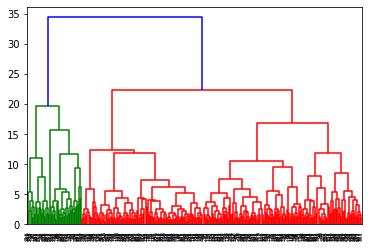

In [74]:
dendrogram = sch.dendrogram(sch.linkage(data_pca, method='ward'))

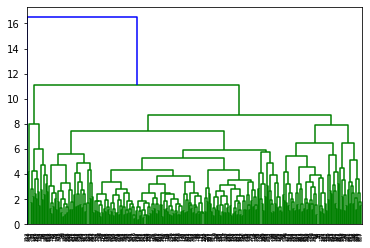

In [82]:
dendrogram = sch.dendrogram(sch.linkage(data_pca, method='complete'))

In [75]:
for i in range(10, 34):
    ward = AgglomerativeClustering(n_clusters=None, linkage='ward', distance_threshold=i).fit(data_pca)
    print(*set(ward.labels_))

0 1 2 3 4 5 6 7 8 9 10 11
0 1 2 3 4 5 6 7 8 9 10
0 1 2 3 4 5 6
0 1 2 3 4 5
0 1 2 3 4 5
0 1 2 3 4 5
0 1 2 3 4
0 1 2 3
0 1 2 3
0 1 2 3
0 1 2
0 1 2
0 1 2
0 1
0 1
0 1
0 1
0 1
0 1
0 1
0 1
0 1
0 1
0 1


In [44]:
import random as rnd

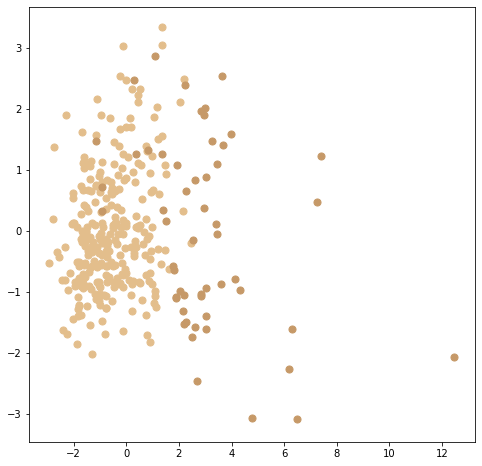

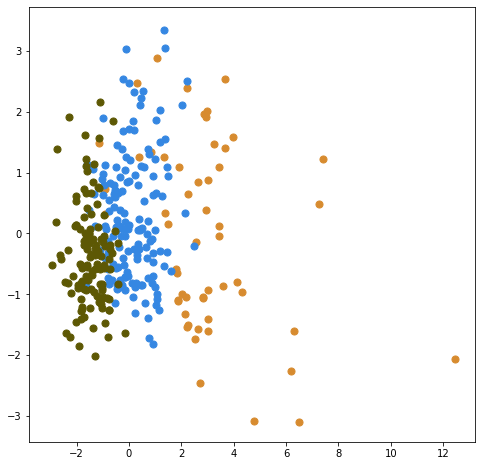

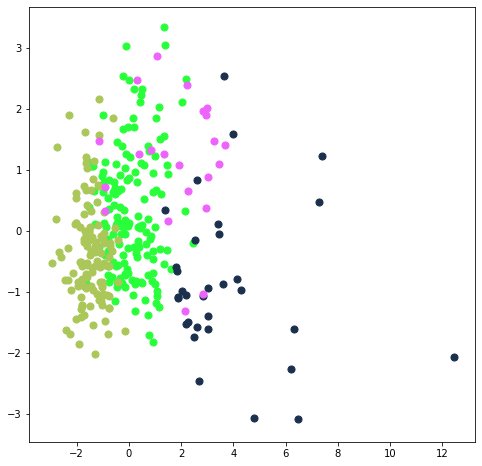

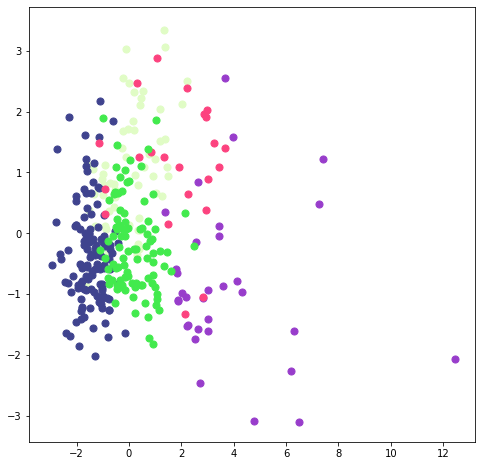

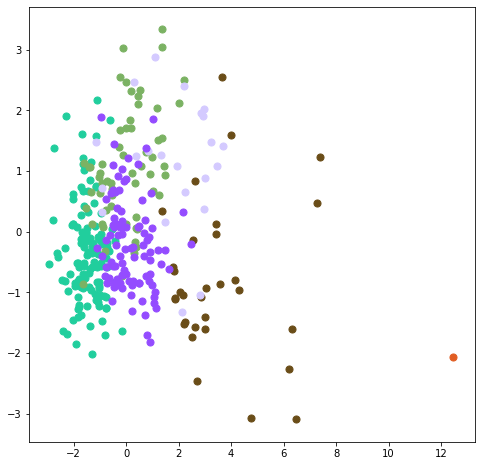

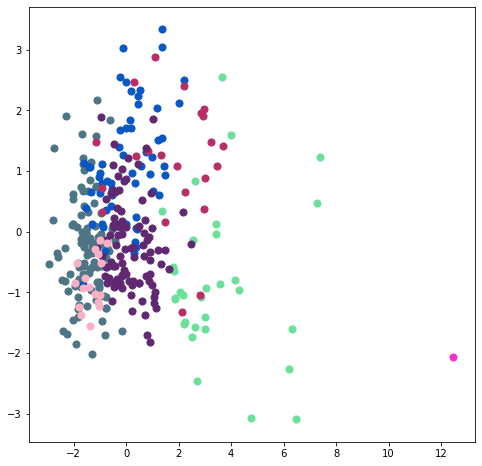

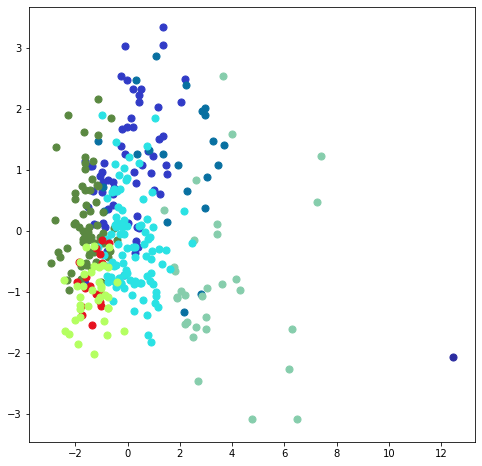

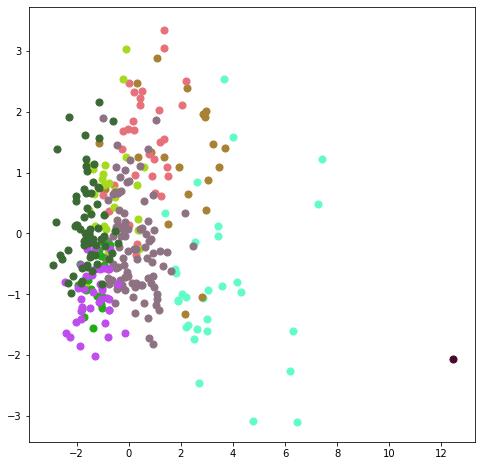

In [77]:
# Визуализация для Climate и HousingCost (первые два столбца) разделения на 2-9 кластеров, linkage = 'ward'

for i in range(2, 10):
    ward = AgglomerativeClustering(n_clusters=i, linkage='ward').fit(data_pca)
    label = ward.labels_

    fig = plt.figure(figsize=(8,8),)
    for k in range(i):
        x = rnd.randint(2, 255)
        y = rnd.randint(2, 255)
        z= rnd.randint(2, 255)
        plt.scatter(data_pca[label==k, 0], data_pca[label==k, 1], s=50, marker='o',
                    color='#{:02x}{:02x}{:02x}'.format(x,y,z))
    plt.show()

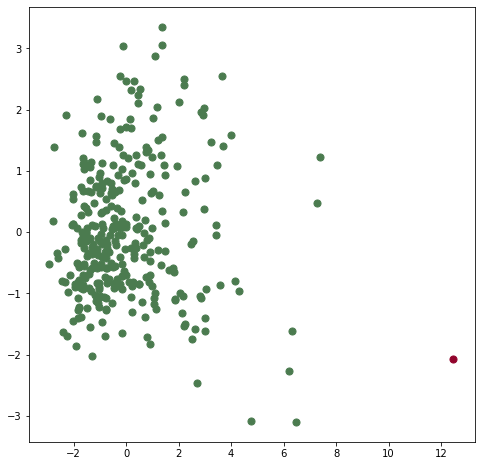

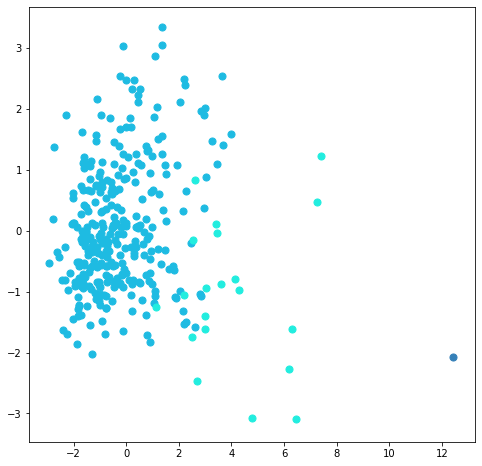

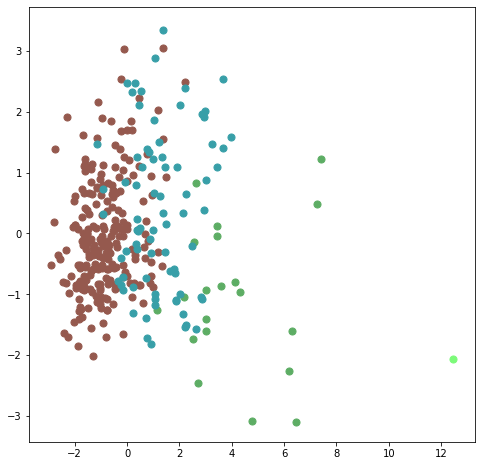

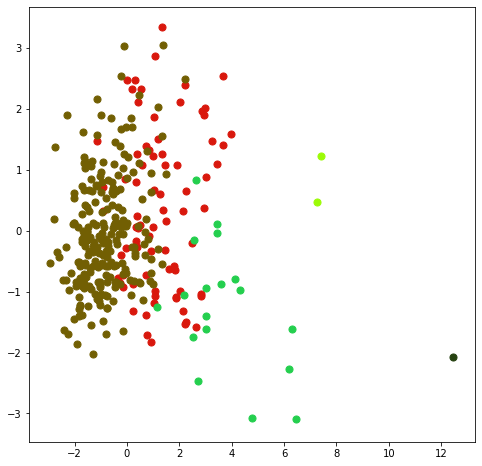

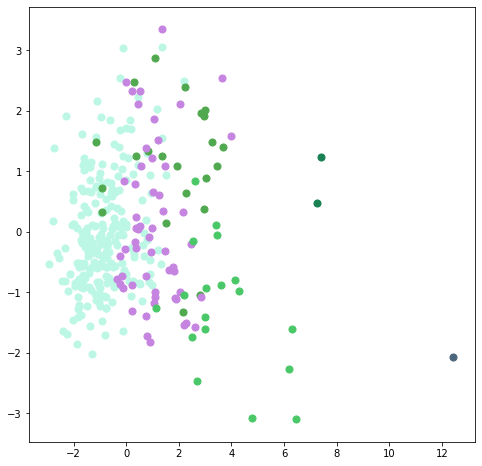

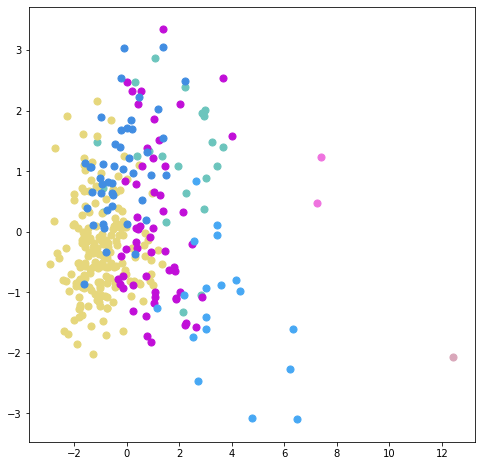

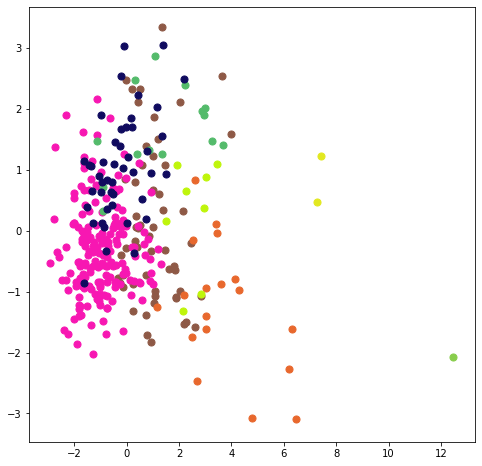

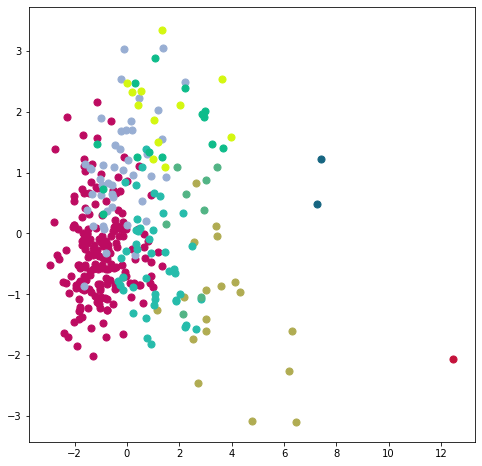

In [78]:
# Визуализация для Climate и HousingCost (первые два столбца) разделения на 2-9 кластеров, linkage = 'complete'

for i in range(2, 10):
    ward = AgglomerativeClustering(n_clusters=i, linkage='complete').fit(data_pca)
    label = ward.labels_

    fig = plt.figure(figsize=(8,8),)
    for k in range(i):
        x = rnd.randint(2, 255)
        y = rnd.randint(2, 255)
        z= rnd.randint(2, 255)
        plt.scatter(data_pca[label==k, 0], data_pca[label==k, 1], s=50, marker='o',
                    color='#{:02x}{:02x}{:02x}'.format(x,y,z))
    plt.show()

#### Очевидно, оптимальное количество кластеров [2, 3], при расстояниях из [20, 34]

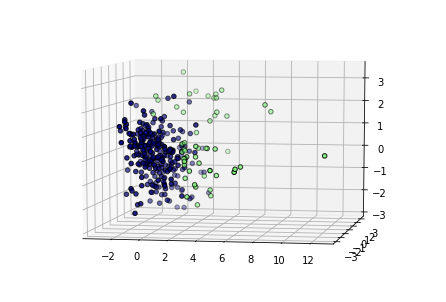

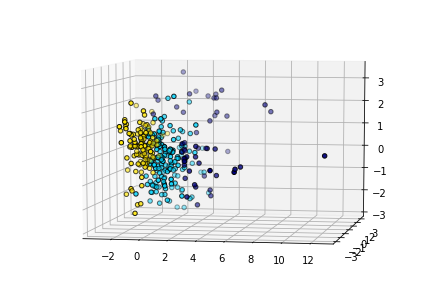

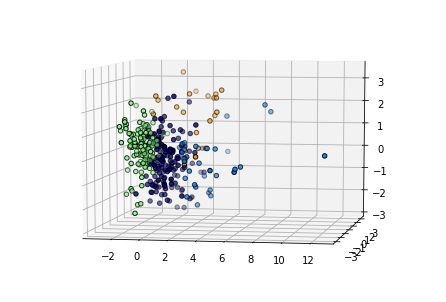

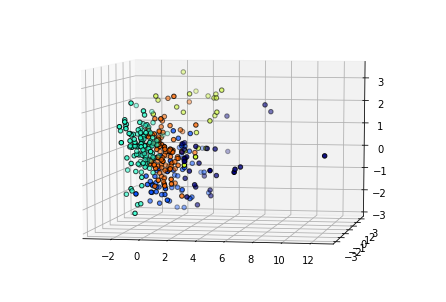

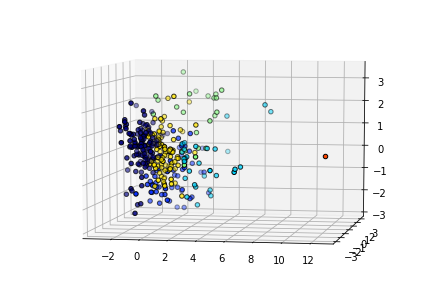

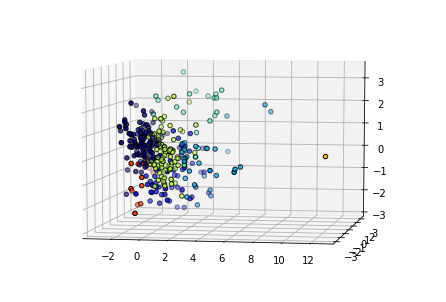

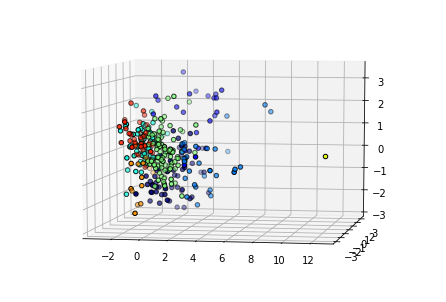

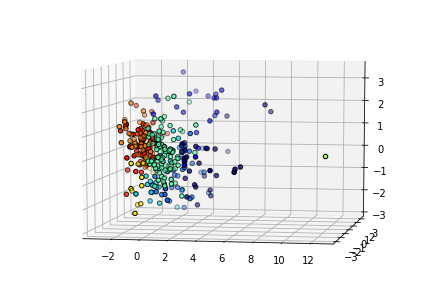

In [83]:
for i in range(2, 10):
    label = AgglomerativeClustering(n_clusters=i, linkage='ward').fit(data_pca).labels_
    fig = plt.figure()
    ax = p3.Axes3D(fig)
    ax.view_init(7, -80)
    for l in np.unique(label):
        ax.scatter(data_pca[label == l, 0], data_pca[label == l, 1], data_pca[label == l, 2],
                   color=plt.cm.jet(float(l) / np.max(label + 1)),
                   s=20, edgecolor='k')

### VISUALIZATION for 2-5 Clusters

2 clusters


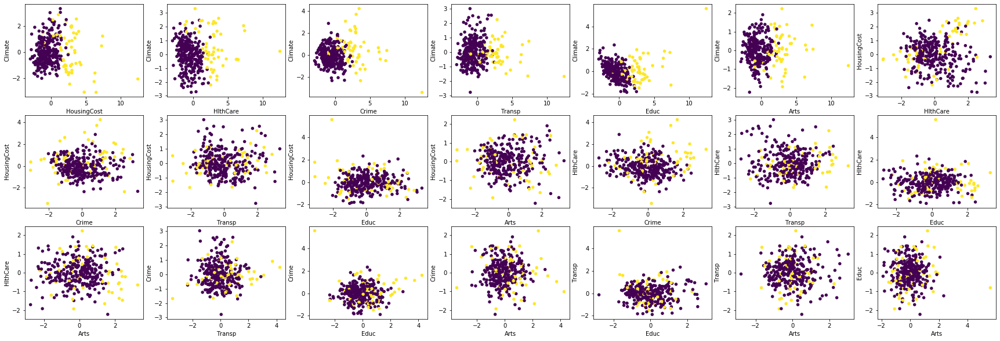

3 clusters


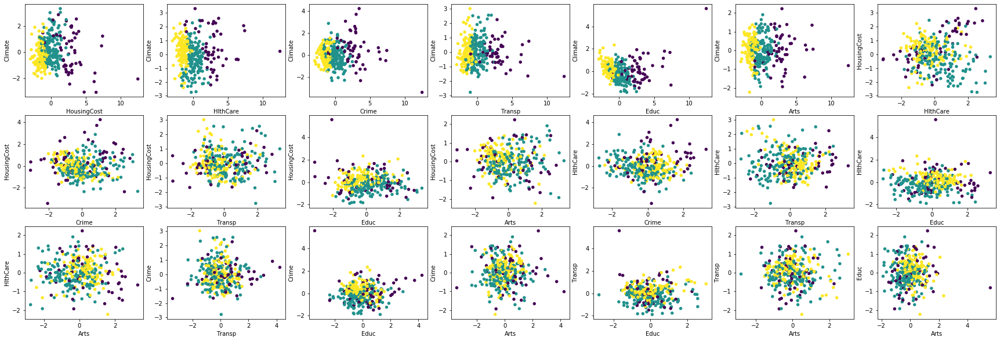

4 clusters


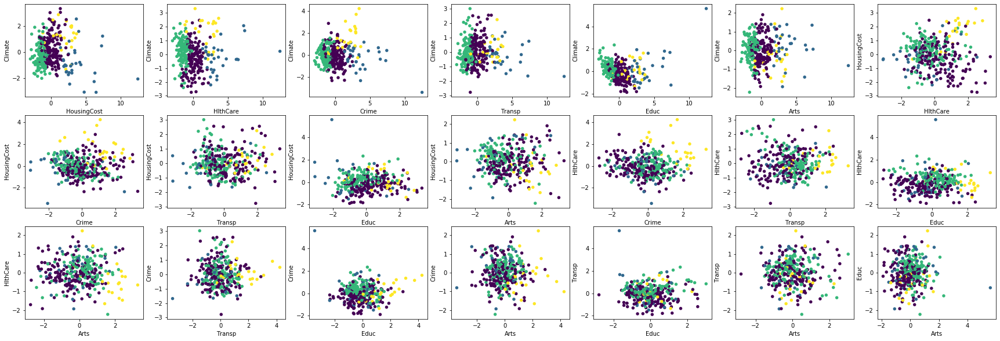

5 clusters


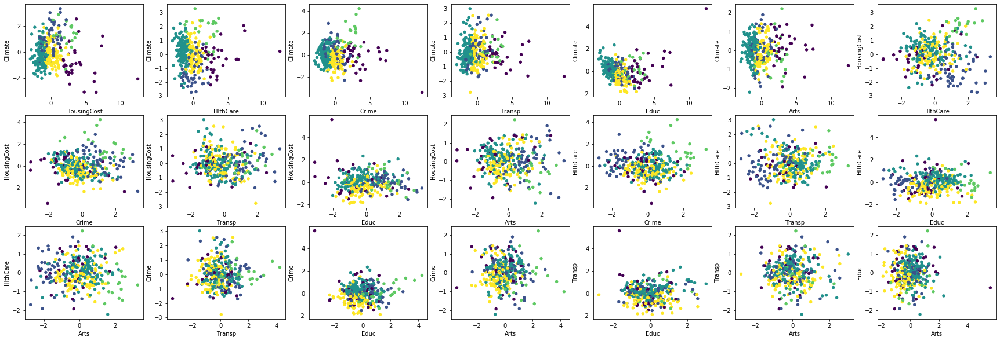

In [84]:
for k in range(2, 6):
    fig = plt.figure(figsize=(30,10))
    label = AgglomerativeClustering(n_clusters=k, linkage='ward').fit(data_pca).labels_
    j = 0
    print(f"{k} clusters")
    for i in combinations(range(7), 2):   
        plt.subplot(3, 7, j + 1)
        plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
        plt.xlabel(col[i[1]])
        plt.ylabel(col[i[0]])
        j += 1
    
    plt.show()

## №2 DBSCAN

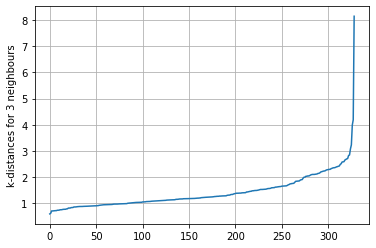

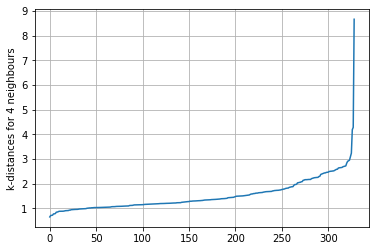

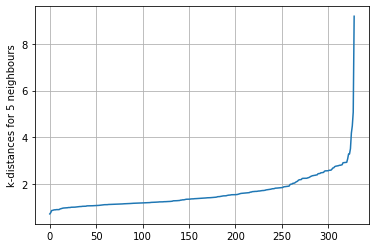

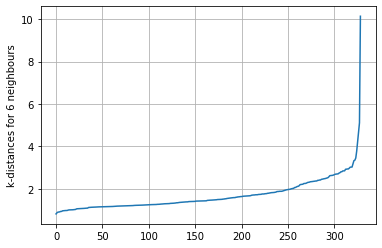

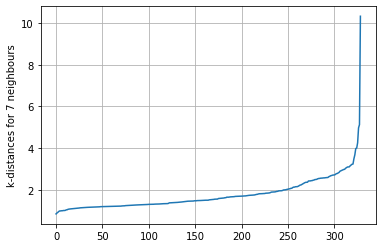

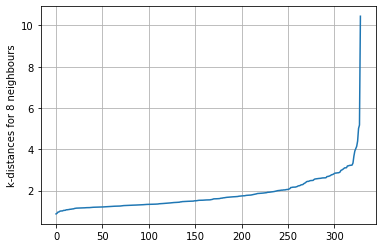

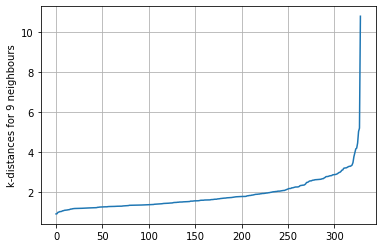

In [85]:
from sklearn.neighbors import NearestNeighbors

for i in range(3, 10):
    nbrs = NearestNeighbors(n_neighbors=i, algorithm='ball_tree').fit(data_pca)
    distances, indices = nbrs.kneighbors(data_pca)
    
    plt.plot(sorted(distances[:, -1]))
    plt.ylabel(f"k-distances for {i} neighbours")
    plt.grid(True)
    plt.show()

#### Реализация эвристики

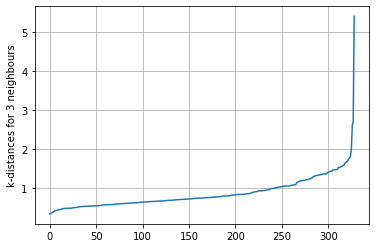

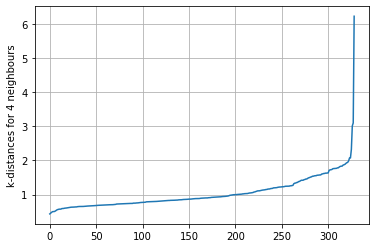

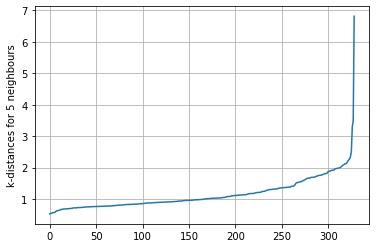

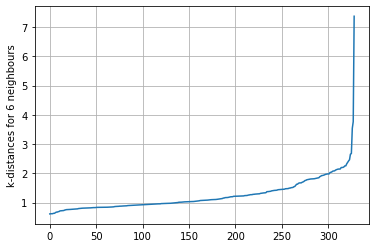

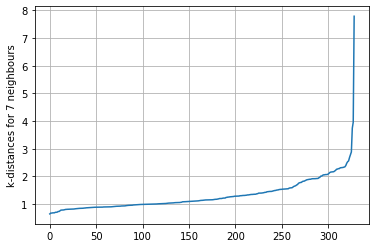

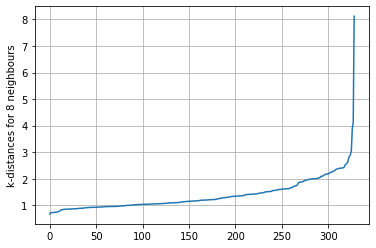

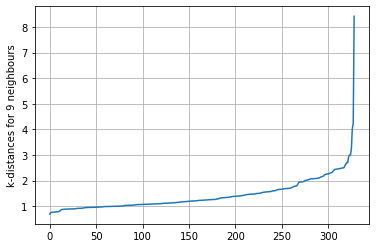

In [86]:
# для каждой точки высчитывается среднее расстояние до n ближайших соседей
def k_neib(p, data, n):
    return sum(sorted([np.linalg.norm(p - q) for q in data])[: n]) / n

# для каждой точки в датасете высчитывается среднее р-е до n ближайших соседей
def all_knn(min_pts):
    all_knn = []
    for i in data_pca:
        all_knn.append(k_neib(i, data_pca, min_pts))
    return sorted(all_knn)

# функция all_knn(min_pts) возвращает отсортированный массив средних расстояний каждой точки до её n ближайших соседей
for i in range(3, 10):
    nbrs = all_knn(i)
    
    plt.plot(nbrs)
    plt.ylabel(f"k-distances for {i} neighbours")
    plt.grid(True)
    plt.show()

#### Из Еlbow метода видно, что для любого min_pts критерий eps  должен быть ~2-3 при min_pts = 4
#### при 0.8 <= eps < 2 кластеров получается слишком много (4, 6 при 0.9) и они плохо разделяются
#### при eps < 0.8 почти все точки кластеризуются как выбросы
#### при eps > 2.5 почти все считается одним кластером с выбросами, здесь выбор eps зависит от того, что считать выбросами

In [87]:
db = DBSCAN(eps=0.9, min_samples=4).fit(data_pca)
label = db.labels_
#label

In [88]:
from itertools import combinations

In [89]:
col = list(data.columns)

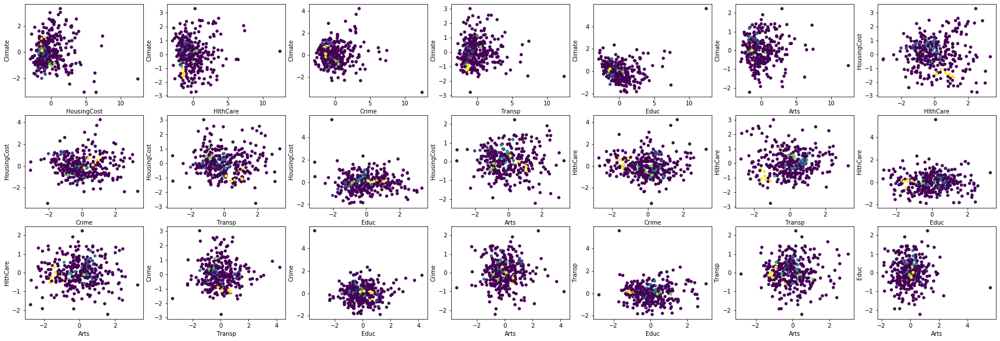

In [90]:
# визуализация DBSCAN для каждой пары признаков при eps=0.9 - 6 кластеров - слишком много

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

In [91]:
db = DBSCAN(eps=1.25, min_samples=4).fit(data_pca)
label = db.labels_
#label

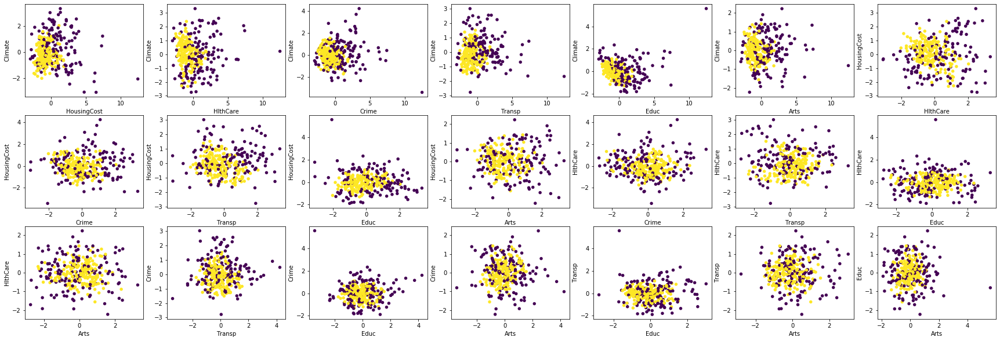

In [92]:
# визуализация DBSCAN для каждой пары признаков при eps=1.25 - тоже много

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

In [93]:
db = DBSCAN(eps=2, min_samples=4).fit(data_pca)
label = db.labels_
#label

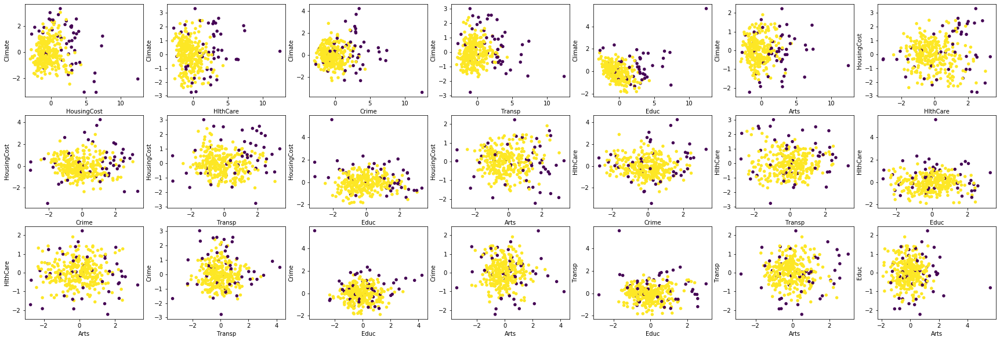

In [94]:
# визуализация DBSCAN для каждой пары признаков при eps=2

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

In [95]:
db = DBSCAN(eps=4, min_samples=4).fit(data_pca)
label = db.labels_
#label

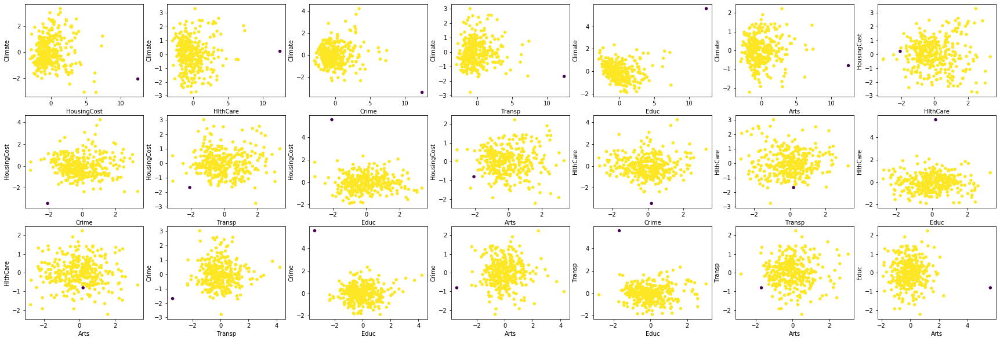

In [96]:
# визуализация DBSCAN для каждой пары признаков при eps=3 - не все выбросы считаются таковыми

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Anaconda\lib\site-p

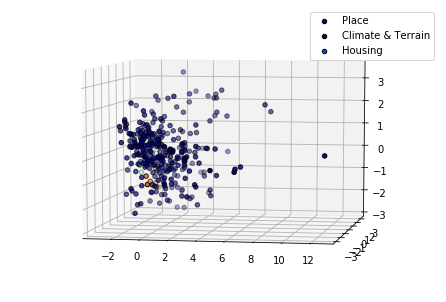

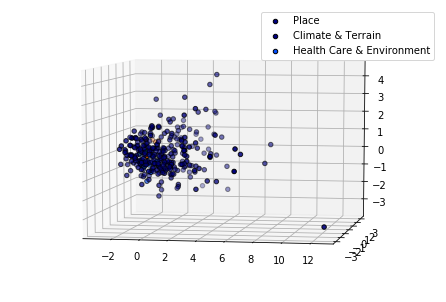

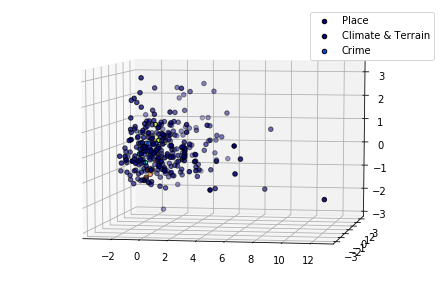

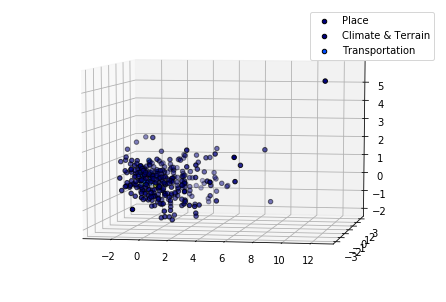

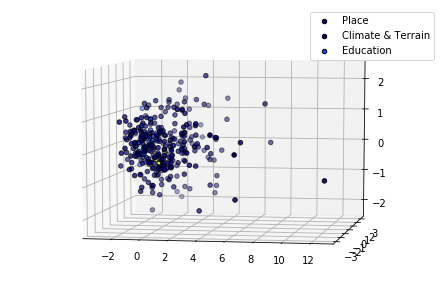

...

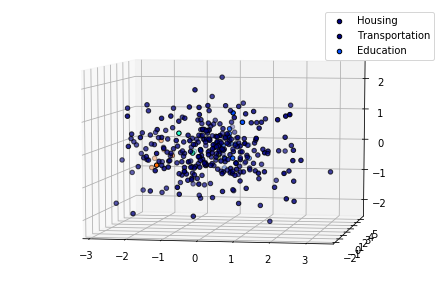

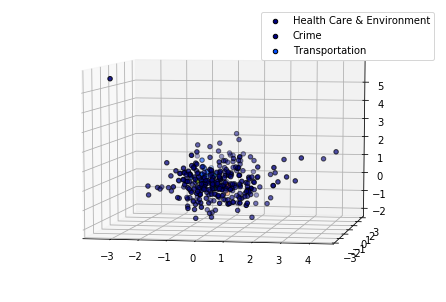

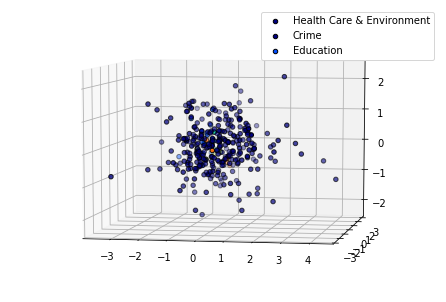

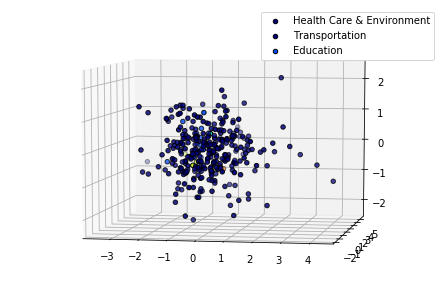

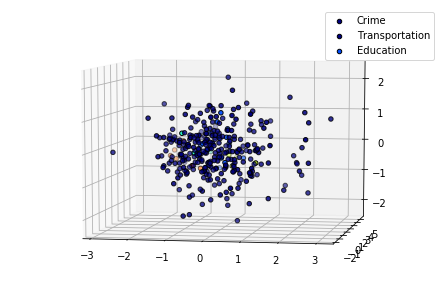

In [97]:
# трёхмерное изображение по тройкам признаков

j = 0
for i in combinations(range(7), 3):
    label = DBSCAN(eps=0.9, min_samples=4).fit(data_pca).labels_
    fig = plt.figure()
    ax = p3.Axes3D(fig)
    ax.view_init(7, -80)
    for l in np.unique(label):
        ax.scatter(data_pca[label == l, i[0]], data_pca[label == l, i[1]], data_pca[label == l, i[2]],
                   color=plt.cm.jet(float(l) / np.max(label + 1)),
                   s=20, edgecolor='k')
        plt.legend([data_desc['Attribute'][i[0]], data_desc['Attribute'][i[1]], data_desc['Attribute'][i[2]]])
    j += 1



## №3 K-Means

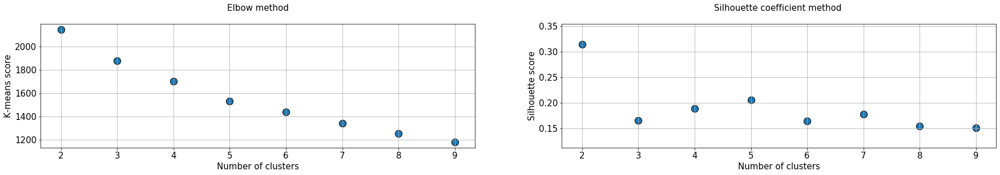

In [98]:
# подбор параметров методом локтя и силуэта
from sklearn.metrics import silhouette_score


km_scores= []
km_silhouette = []
vmeasure_score =[]
db_score = []
for i in range(2,10):
    km = KMeans(n_clusters=i, random_state=0).fit(data_pca)
    preds = km.predict(data_pca)
    
    km_scores.append(-km.score(data_pca))
    
    silhouette = silhouette_score(data_pca, preds)
    km_silhouette.append(silhouette)


plt.figure(figsize=(30, 4))
plt.subplot(1, 2, 1)
plt.title("Elbow method\n", fontsize=15)
plt.scatter(x=[i for i in range(2, 10)], y=km_scores, s=150, edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters", fontsize=15)
plt.ylabel("K-means score", fontsize=15)
plt.xticks([i for i in range(2, 10)], fontsize=15)
plt.yticks(fontsize=15)

plt.subplot(1, 2, 2)
plt.title("Silhouette coefficient method \n", fontsize=15)
plt.scatter(x=[i for i in range(2,10)], y=km_silhouette, s=150, edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters", fontsize=15)
plt.ylabel("Silhouette score", fontsize=15)
plt.xticks([i for i in range(2,10)], fontsize=15)
plt.yticks(fontsize=15)
plt.show()

#### из критериев подбора параметров для KMeans также видно, что оптимальные количества кластеров [2, 3]

In [99]:
km = KMeans(n_clusters=2, random_state=123).fit(data_pca)
label = km.labels_
#label

In [100]:
km.cluster_centers_

array([[-0.85345569, -0.00879662, -0.00760901, -0.03364808, -0.02785132,
         0.06442818, -0.02922794],
       [ 2.37398019,  0.02446877,  0.02116531,  0.0935958 ,  0.07747149,
        -0.17921403,  0.08130071]])

2 clusters


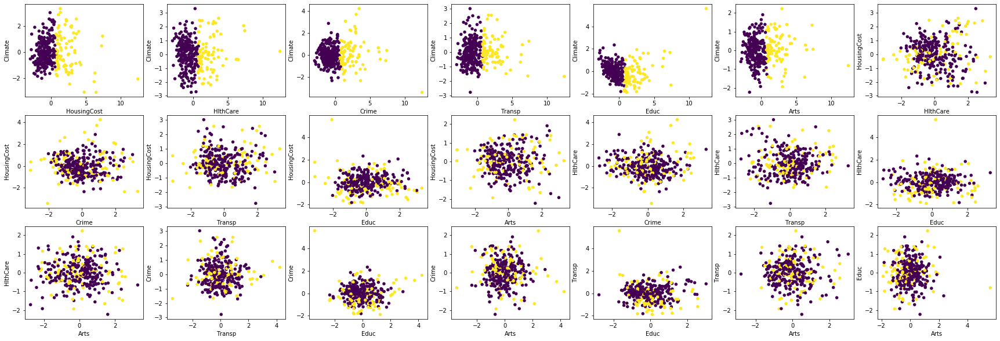

3 clusters


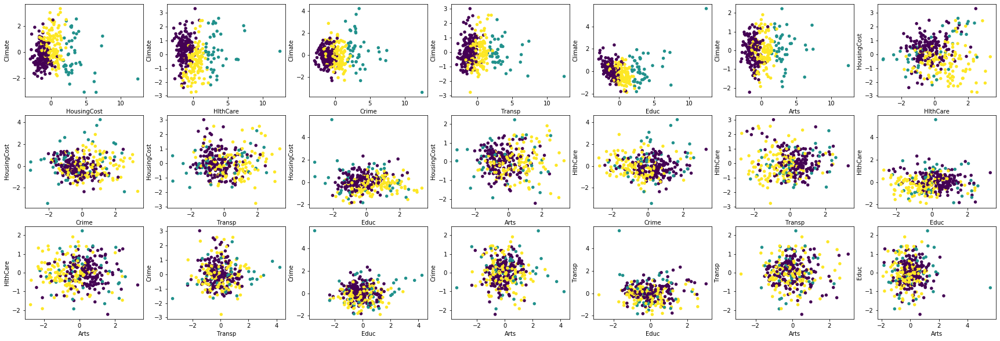

4 clusters


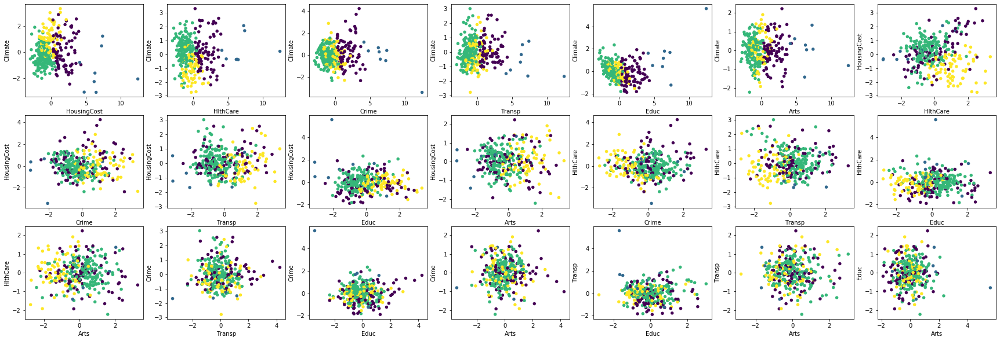

5 clusters


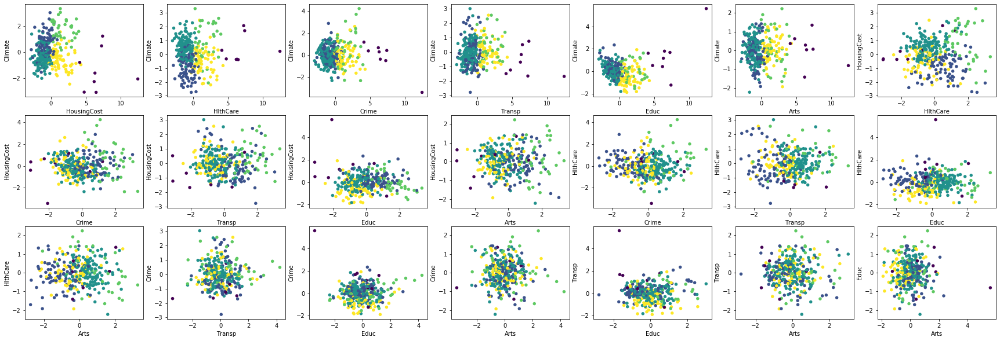

In [101]:
for k in range(2, 6):
    fig = plt.figure(figsize=(30,10))
    label = KMeans(n_clusters=k, random_state=123).fit(data_pca).labels_
    j = 0
    print(f"{k} clusters")
    for i in combinations(range(7), 2):   
        plt.subplot(3, 7, j + 1)
        plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
        plt.xlabel(col[i[1]])
        plt.ylabel(col[i[0]])
        j += 1
    
    plt.show()

#### Оптимальное число кластеров - 2-3

## №4 Self-written PAM-algorithm

In [102]:
from datetime import datetime

In [103]:
pam = PAM(2)
start_time = datetime.now()
pam.fit(data_pca)
delta = datetime.now() - start_time
pam.labels_

array([97., 66., 97., 66., 66., 97., 97., 97., 97., 97., 66., 66., 97.,
       97., 66., 97., 97., 97., 97., 66., 97., 97., 97., 97., 97., 66.,
       97., 97., 97., 97., 97., 97., 97., 66., 97., 97., 97., 97., 97.,
       97., 97., 97., 66., 66., 97., 97., 97., 66., 97., 97., 97., 97.,
       66., 97., 66., 97., 97., 97., 66., 66., 97., 66., 66., 97., 66.,
       97., 66., 97., 66., 97., 97., 66., 97., 66., 97., 97., 66., 66.,
       97., 97., 66., 97., 97., 66., 97., 66., 97., 97., 97., 97., 97.,
       97., 97., 97., 97., 97., 66., 97., 97., 97., 97., 97., 97., 97.,
       97., 97., 97., 66., 97., 97., 97., 97., 97., 66., 97., 97., 97.,
       97., 66., 97., 97., 97., 97., 97., 97., 97., 97., 97., 97., 66.,
       66., 97., 66., 97., 66., 97., 97., 66., 97., 97., 97., 66., 97.,
       97., 66., 97., 97., 97., 97., 97., 97., 97., 66., 97., 97., 97.,
       97., 97., 97., 97., 97., 97., 97., 97., 97., 97., 97., 66., 97.,
       97., 97., 97., 97., 97., 97., 97., 97., 97., 66., 66., 97

In [104]:
print(f"Self-written PAM algorithm work time: {delta.seconds} sec {delta.microseconds} microsec")

Self-written PAM algorithm work time: 290 sec 128513 microsec


C:\Anaconda\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



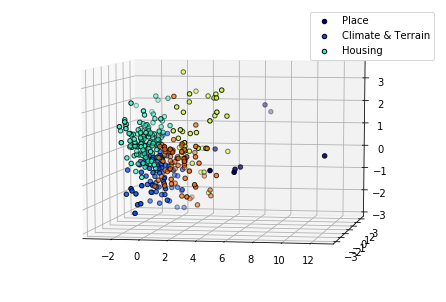

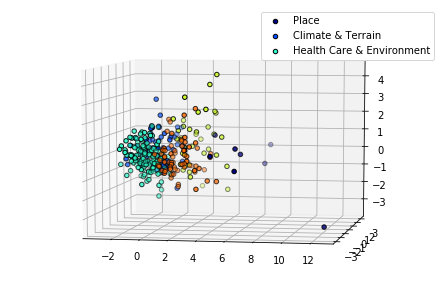

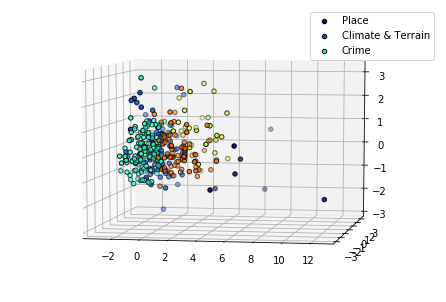

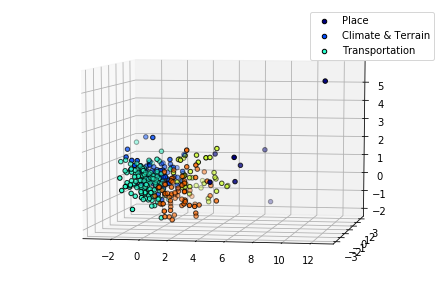

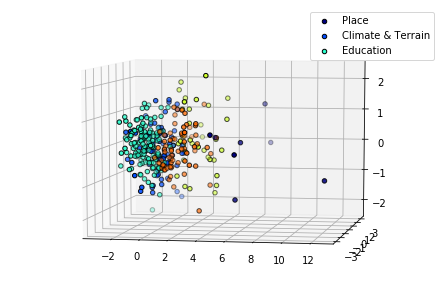

...

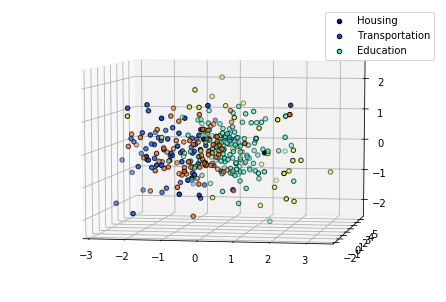

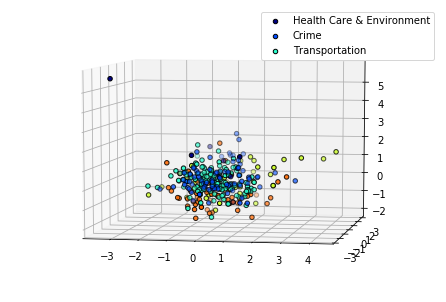

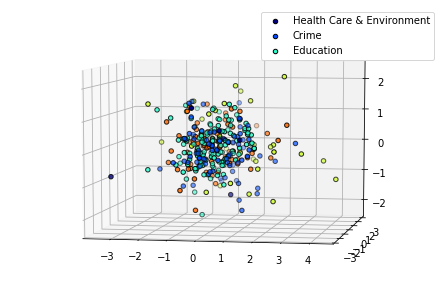

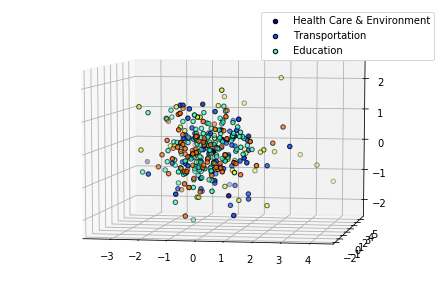

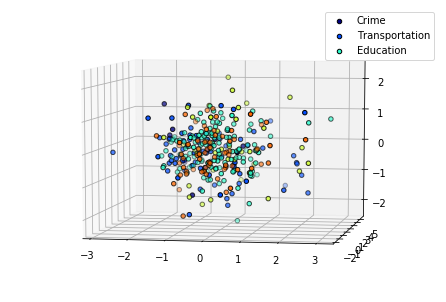

In [105]:
# трёхмерное изображение по тройкам признаков для n=2

j = 0
for i in combinations(range(7), 3):
    fig = plt.figure()
    ax = p3.Axes3D(fig)
    ax.view_init(7, -80)
    for l in np.unique(label):
        ax.scatter(data_pca[label == l, i[0]], data_pca[label == l, i[1]], data_pca[label == l, i[2]],
                   color=plt.cm.jet(float(l) / np.max(label + 1)),
                   s=20, edgecolor='k')
        plt.legend([data_desc['Attribute'][i[0]], data_desc['Attribute'][i[1]], data_desc['Attribute'][i[2]]])
    j += 1

2 clusters


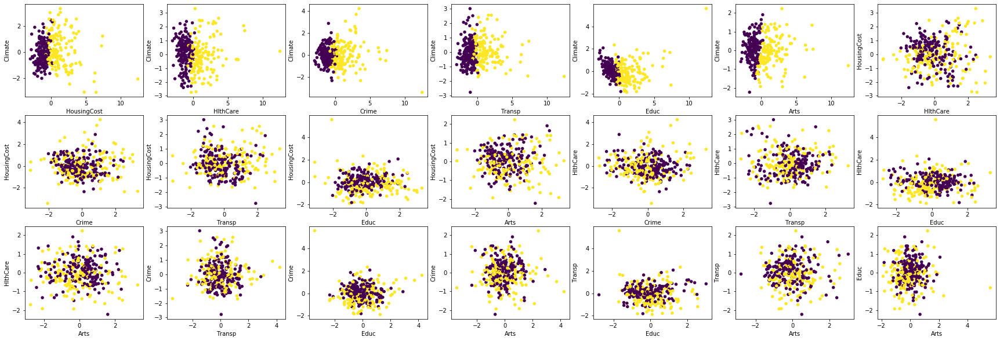

3 clusters


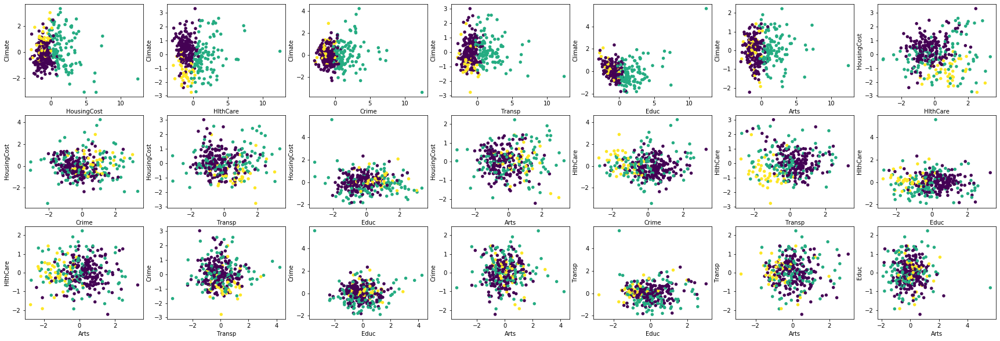

4 clusters


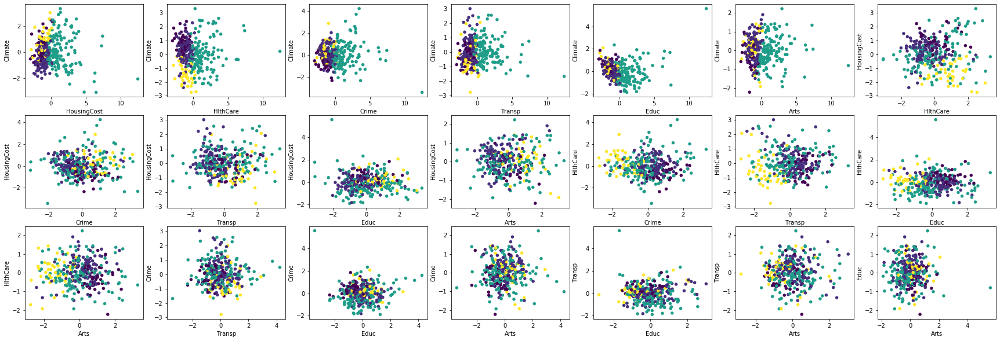

5 clusters


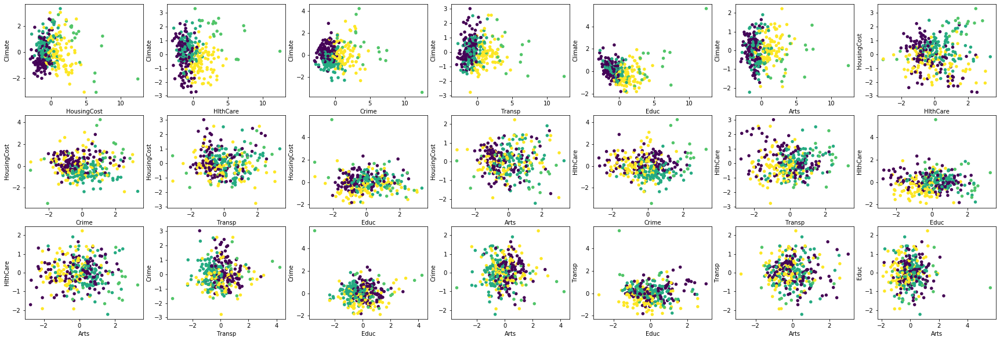

In [112]:
for k in range(2, 6):
    fig = plt.figure(figsize=(30,10))
    pam = PAM(k)
    pam.fit(data_pca)
    label = pam.labels_
    j = 0
    print(f"{k} clusters")
    for i in combinations(range(7), 2):   
        plt.subplot(3, 7, j + 1)
        plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label, cmap='viridis', lw=0, s=30)
        plt.xlabel(col[i[1]])
        plt.ylabel(col[i[0]])
        j += 1
    
    plt.show()

In [155]:
# Закомментированный код далее - построение отдельных частей графика выше, т.к. исполняется алгоритм ~ 3 минуты

# fig = plt.figure(figsize=(30,10))

# j = 0
# for i in combinations(range(7), 2):
#     plt.subplot(3, 7, j + 1)
#     plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label2, cmap='viridis', lw=0, s=30)
#     plt.xlabel(col[i[1]])
#     plt.ylabel(col[i[0]])
#     j += 1

In [69]:
# pam = PAM(3)
# pam.fit(data_pca)
# label3 = pam.labels_

In [153]:
# fig = plt.figure(figsize=(30,10))

# j = 0
# for i in combinations(range(7), 2):
#     plt.subplot(3, 7, j + 1)
#     plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label3, cmap='viridis', lw=0, s=30)
#     plt.xlabel(col[i[1]])
#     plt.ylabel(col[i[0]])
#     plt.legend(label)
#     j += 1

In [80]:
# pam = PAM(5)
# pam.fit(data_pca)
# label5 = pam.labels_

In [154]:
# fig = plt.figure(figsize=(30,10))

# j = 0
# for i in combinations(range(7), 2):
#     plt.subplot(3, 7, j + 1)
#     plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=label5, cmap='viridis', lw=0, s=30)
#     plt.xlabel(col[i[1]])
#     plt.ylabel(col[i[0]])
#     j += 1

#### Аналогично KMeans, лучшим кажется разбиение на 2-3 кластера

## №5

In [108]:
import hdbscan

In [2]:
#conda install -c conda-forge hdbscan

#### Видно, что при min_cluster_size > 5 все считается одним кластером, состоящим из выбросов
#### при min_cluster_size = [2, 3] хорошо видно основной класс и граничные с ним точки
#### при min_cluster_size = [4, 5] большинство точек считается граничными для малого количества основных, классы смешиваются и плохо разделяются

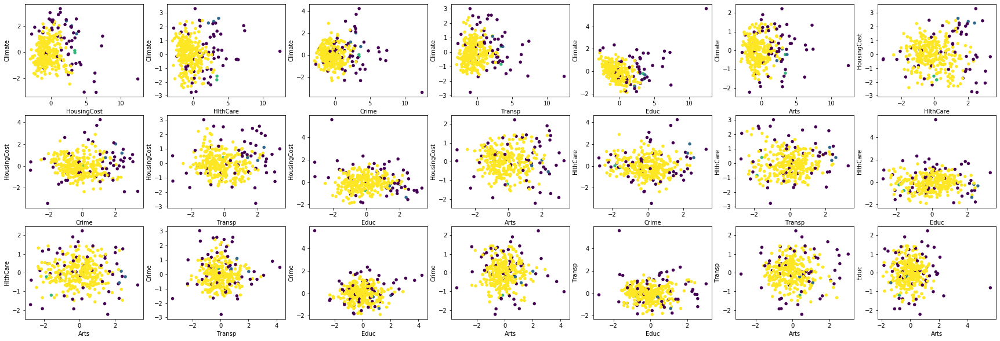

In [109]:
hd = hdbscan.HDBSCAN(min_cluster_size=2)
labels = hd.fit_predict(data_pca)

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=labels, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

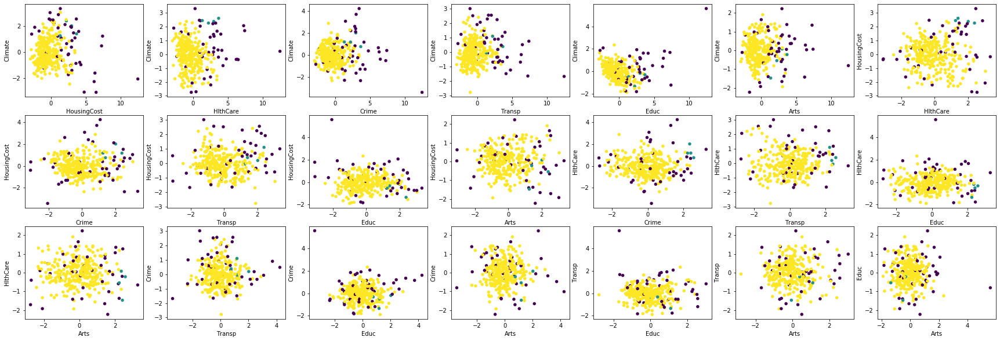

In [110]:
hd = hdbscan.HDBSCAN(min_cluster_size=3)
labels = hd.fit_predict(data_pca)

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=labels, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

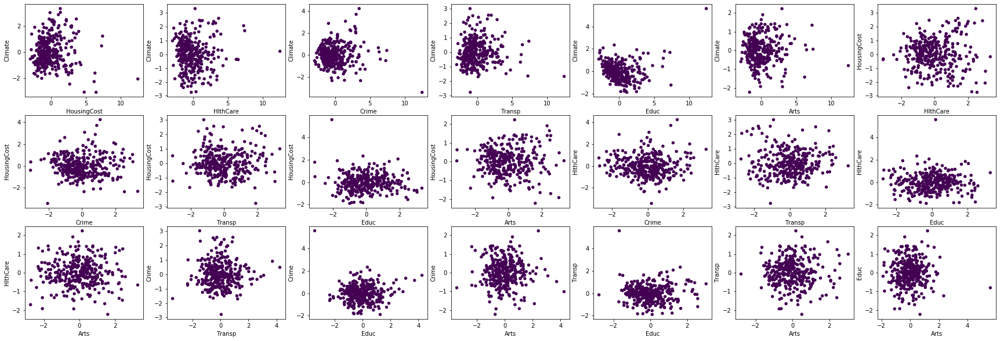

In [111]:
hd = hdbscan.HDBSCAN(min_cluster_size=6)
labels = hd.fit_predict(data_pca)

fig = plt.figure(figsize=(30,10))

j = 0
for i in combinations(range(7), 2):
    plt.subplot(3, 7, j + 1)
    plt.scatter(data_pca[:, i[0]], data_pca[:, i[1]], c=labels, cmap='viridis', lw=0, s=30)
    plt.xlabel(col[i[1]])
    plt.ylabel(col[i[0]])
    j += 1

### Практически не отличимо от DBSCAN, алгоритм также выделяет максимум один полноценный класс

## №6
#### Для большинства алгоритмов оптимальное разбиение - 2-3 класса, согласно эвристикам
#### Исключения - DBSCAN и HDBSCAN - в них невозможно добиться четкого разделения больше, чем на 2 кластера, притом один - основной, а другой - выбросов
#### Наиболее удачные кластеризации - KMeans, Agglomerative и написанный PAM (не учитывая время его работы) - в них кластеры разделяются наилучшим образом, не зависимо от количества задаваемых, все три делят кластеры похожим образом (из  визуализации)
#### Оценки метриками (Silhouette, Elbow, Dendrogram...) произведены непосредственно в пунктах кластеризаций выше

## №7 Лучшая метрика - KMeans

### Интерпретация: на данном датасете кластеризация - попытка разбить города по уровням качества (преимуществам) жизни в них, в зависимости от социальных и климатических факторов.

In [231]:
km = KMeans(n_clusters=2, random_state=123).fit(data_pca)
label = km.labels_
cl_cent = km.cluster_centers_

In [208]:
ones = np.where(label==1)
zeros = np.where(label==0)

In [209]:
df2_1 = df.loc[df["index"].isin(ones[0])]
df2_0 = df.loc[df["index"].isin(zeros[0])]

In [8]:
# df2_0.describe()

In [7]:
# df2_1.describe()

### Из приведенного разбиения по двум кластерам можно увидеть, что в первом средние значения значительно выше, чем в нулевом - это значит, что при разбиение на два кластера вполне эффективно для бинарного оценивания т.н. качества жизни в городе

In [232]:
km = KMeans(n_clusters=3, random_state=123).fit(data_pca)
label = km.labels_
cl_cent_3 = km.cluster_centers_

In [213]:
twos = np.where(label==2)
ones = np.where(label==1)
zeros = np.where(label==0)

In [214]:
df3_2 = df.loc[df["index"].isin(twos[0])]
df3_1 = df.loc[df["index"].isin(ones[0])]
df3_0 = df.loc[df["index"].isin(zeros[0])]

In [4]:
# df3_0.describe()

In [5]:
# df3_1.describe()

In [6]:
# df3_2.describe()

### Разбиение на три кластера методом KMeans тоже можно объяснить, исследуя, например, средние показатели - в первом кластере - они наилучшие, в нулевом - наименьшие

In [3]:
# conda install -c conda-forge folium

In [220]:
import folium

##### Распределение для двух кластеров

### Нулевой кластер

In [248]:
lat20 = np.array(df2_0["Lat"])
long20 = np.array(df2_0["Long"])

In [254]:
m_cl_0 = folium.Map(location=[df2_0["Lat"].mean(), df2_0["Long"].mean()])
for i in range(len(df2_0)):
    folium.Marker([lat20[i], long20[i]], popup=f'The {i} observation').add_to(m_cl_0)
    m_cl_0.add_child(folium.ClickForMarker(popup='Waypoint'))
m_cl_0

### Первый кластер

In [256]:
lat21 = np.array(df2_1["Lat"])
long21 = np.array(df2_1["Long"])

In [261]:
m_cl_1 = folium.Map(location=[df2_1["Lat"].mean(), df2_1["Long"].mean()])
for i in range(len(df2_1)):
    folium.Marker([lat21[i], long21[i]], popup=f'The {i} observation').add_to(m_cl_1)
    m_cl_1.add_child(folium.ClickForMarker(popup='Waypoint'))
m_cl_1

##### Распределение для трёх кластеров

### Нулевой кластер

In [264]:
lat30 = np.array(df3_0["Lat"])
long30 = np.array(df3_0["Long"])

In [274]:
m_cl3_0 = folium.Map(location=[df3_0["Lat"].mean(), df3_0["Long"].mean()])
for i in range(len(df3_0)):
    folium.Marker([lat30[i], long30[i]], popup=f'The {i} observation').add_to(m_cl3_0)
    m_cl3_0.add_child(folium.ClickForMarker(popup='Waypoint'))
m_cl3_0

### Первый кластер

In [268]:
lat31 = np.array(df3_1["Lat"])
long31 = np.array(df3_1["Long"])

In [269]:
m_cl3_1 = folium.Map(location=[df3_1["Lat"].mean(), df3_1["Long"].mean()])
for i in range(len(df3_1)):
    folium.Marker([lat31[i], long31[i]], popup=f'The {i} observation').add_to(m_cl3_1)
    m_cl3_1.add_child(folium.ClickForMarker(popup='Waypoint'))
m_cl3_1

### Второй кластер

In [270]:
lat32 = np.array(df3_2["Lat"])
long32 = np.array(df3_2["Long"])

In [272]:
m_cl3_2 = folium.Map(location=[df3_2["Lat"].mean(), df3_2["Long"].mean()])
for i in range(len(df3_2)):
    folium.Marker([lat32[i], long32[i]], popup=f'The {i} observation').add_to(m_cl3_2)
    m_cl3_2.add_child(folium.ClickForMarker(popup='Waypoint'))
m_cl3_2

### Сильную территориальную зависимость по кластерам выделить сложно, однако, есть места, которые встречаются только в одном из них. Например, для трёх кластеров: южно-центральные территории (New Mexico), центральные (Wyoming, South Dakota, Nevada, Arizona), а также юго-восток (Florida) присутствуют только во втором кластере. В первом класторе почти польностью отсутсвую наблюдения о центральной части, северной, восточной и о юго-юго-восточной. Северо-запад (Idaho, Oregon) присутствует только в нулевом кластере. Также можно проследить наибольшие концентрации городов по кластерам - для второго это Florida и юго-восток, для нулевого - восток и северо-восток, для первого - наименьшего - New-York.

### Для двух кластеров выделить территориальную зависимость почти невозможно, так как территории каждого штата втречаются в каждом кластере, просто размер первого - меньше, соответственно на него приходится меньше наблюдений для каждой территории.